<!-- Notebook title -->
# Diffusion

# 1. Notebook Description

### 1.1 Task Description
<!-- 
- A brief description of the problem you're solving with machine learning.
- Define the objective (e.g., classification, regression, clustering, etc.).
-->

TODO

---

# 2. Setup

## 2.1 Imports
<!--
- Import necessary libraries (e.g., `numpy`, `pandas`, `matplotlib`, `scikit-learn`, etc.).
-->

In [1]:
from ikt450.src.common_imports import *
from ikt450.src.config import get_paths
from ikt450.src.common_func import load_dataset, save_dataframe, ensure_dir_exists

import torch
import torchvision
import torchvision.transforms as transforms

import datetime
import torch
from torchvision import transforms
from torchvision.transforms.functional import to_pil_image, to_tensor
from PIL import ImageDraw, ImageFont
import torchvision.datasets as datasets

## 2.2 Global Variables
<!--
- Define global constants, paths, and configuration settings used throughout the notebook.
-->

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

### 2.2.1 Paths

In [3]:
paths = get_paths()

### 2.2.2 Seed

In [4]:
RANDOM_SEED = 7

### 2.2.3 Split ratio

In [5]:
SPLITRATIO = 0.8

## 2.3 Function Definitions
<!--
- Define helper functions that will be used multiple times in the notebook.
- Consider organizing these into separate sections (e.g., data processing functions, model evaluation functions).
-->

# 4. Data Processing

In [6]:
# Mean and std for normalization
mean = [0.485, 0.456, 0.406]  # ImageNet mean
std = [0.229, 0.224, 0.225]   # ImageNet std

In [7]:
class AddDateStampTransform:
    def __init__(self):
        self.date = datetime.datetime.now().strftime("%B %d, %Y")

    def __call__(self, image_tensor):
        # Convert Tensor to PIL Image
        image = to_pil_image(torch.clamp(image_tensor, 0, 1))  # Clamp values to [0, 1]
        image_org = image.copy()
        draw = ImageDraw.Draw(image)
        font = ImageFont.load_default()

        # Coordinates for the text position
        x, y = 10 , 10
        # x, y = torch.randint(5, image.width - 100, (1,)).item(), torch.randint(5, image.height - 20, (1,)).item()

        # Draw the outline (black)
        outline_color = (0, 0, 0)
        for offset in [(-1, -1), (-1, 1), (1, -1), (1, 1)]:  # Four corners around the text
            draw.text((x + offset[0], y + offset[1]), self.date, font=font, fill=outline_color)

        # Draw the main text (white)
        draw.text((x, y), self.date, font=font, fill=(255, 255, 255))

        image = to_tensor(image)
        image_org = to_tensor(image_org)

        diff = torch.abs(image - image_org)
        diff = torch.where(diff > 0.1, torch.tensor(1), diff)

        # where diff is 1, keep the original image, otherwise keep the stamped image
        image = torch.where(diff == 1, image, image_tensor)

        # Convert back to Tensor
        return image, image_tensor

In [8]:
class StampedImageDataset(torch.utils.data.Dataset):
    def __init__(self, root, base_transform, stamp_transform=None):
        self.dataset = datasets.ImageFolder(root=root)
        self.base_transform = base_transform
        self.stamp_transform = stamp_transform if stamp_transform else lambda x: x

    def __getitem__(self, index):
        # Load image and apply base transformation
        img, label = self.dataset[index]
        transformed_img = self.base_transform(img)
        
        # Create stamped image by applying the stamp transformation
        stamped_img,transformed_img = self.stamp_transform(transformed_img.clone())
        
        return stamped_img, transformed_img, label

    def __len__(self):
        return len(self.dataset)

In [9]:
# Define the common transformation sequence without adding the date stamp
train_transform = transforms.Compose([
    transforms.RandomResizedCrop(256),        # Randomly crop the image to 224x224
    transforms.RandomHorizontalFlip(),        # Randomly flip the image horizontally
    transforms.RandomRotation(15),            # Randomly rotate the image by 15 degrees
    transforms.ColorJitter(                   # Randomly change brightness, contrast, saturation, and hue
        brightness=0.1, contrast=0.1, saturation=0.1, hue=0.1
    ),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std),
])

test_transform = transforms.Compose([
    transforms.RandomResizedCrop(256),        # Randomly crop the image to 224x224
  #  transforms.RandomHorizontalFlip(),        # Randomly flip the image horizontally
  #  transforms.RandomRotation(15),            # Randomly rotate the image by 15 degrees
   # transforms.ColorJitter(                   # Randomly change brightness, contrast, saturation, and hue
    #    brightness=0.1, contrast=0.1, saturation=0.1, hue=0.1
    #),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std),
])

In [10]:
# Initialize dataset with stamping transformation
train_dataset = StampedImageDataset(
    root=f"{paths['PATH_COMMON_DATASETS']}/food11/training",
    base_transform=train_transform,
    stamp_transform=AddDateStampTransform()
)

val_dataset = StampedImageDataset(
    root=f"{paths['PATH_COMMON_DATASETS']}/food11/validation",
    base_transform=test_transform,
    stamp_transform=AddDateStampTransform()
)

test_dataset = StampedImageDataset(
    root=f"{paths['PATH_COMMON_DATASETS']}/food11/evaluation",
    base_transform=test_transform,
    stamp_transform=AddDateStampTransform()
)
# make subselt of dataset
train_dataset = torch.utils.data.Subset(train_dataset, range(0, 1000))
# You can load it into a DataLoader as usual
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=16, shuffle=True)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=32, shuffle=False)

In [11]:

# Load and display image from dataloader


---

# 5. Model Development

In [12]:
# display the original image and the reconstructed image
#  and display the difference between the original and the reconstructed image

def display_images(original, reconstructed):
    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(12, 4))
    for ax in axes:
        ax.axis("off")
    # denormalize images
    original=original.to("cpu") 
    reconstructed = reconstructed.to("cpu")
    mean = [0.485, 0.456, 0.406]  # ImageNet mean
    std = [0.229, 0.224, 0.225]   # ImageNet std
    mean = torch.tensor(mean).to(original.device)
    std = torch.tensor(std).to(original.device)
    print(original.device)
    original = original * torch.tensor(std).view(3, 1, 1) + torch.tensor(mean).view(3, 1, 1)
    reconstructed = reconstructed * torch.tensor(std).view(3, 1, 1) + torch.tensor(mean).view(3, 1, 1)

    
    axes[0].imshow(original.permute(1, 2, 0))
    axes[0].set_title("Original")
    
    axes[1].imshow(reconstructed.permute(1, 2, 0))
    axes[1].set_title("Reconstructed")
    
    diff = torch.abs(original - reconstructed)
    axes[2].imshow(diff.permute(1, 2, 0))
    axes[2].set_title("Difference")
    
    plt.tight_layout()
    plt.show()




In [13]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
from torchvision import datasets
import numpy as np
import matplotlib.pyplot as plt


# Enlarged UNet-like architecture without skip connections
class EnlargedUNetNoSkip(nn.Module):
    def __init__(self):
        super(EnlargedUNetNoSkip, self).__init__()
        # Encoder layers
        self.enc1 = self.conv_block(3, 64)
        self.enc2 = self.conv_block(64, 128)
        self.enc3 = self.conv_block(128, 256)
        self.enc4 = self.conv_block(256, 512)
        
        # Bottleneck
        self.bottleneck = self.conv_block(512, 1024)
        
        # Decoder layers without concatenation (no skip connections)
        self.dec4 = self.conv_block(1024, 512)
        self.dec3 = self.conv_block(512, 256)
        self.dec2 = self.conv_block(256, 128)
        self.dec1 = self.conv_block(128, 64)
        
        # Final layer with activation function
        self.final = nn.Sequential(
            nn.Conv2d(64, 3, kernel_size=1),
          #  nn.Sigmoid()  # Ensure output is between 0 and 1
        )

    def conv_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        # Encoding path
        enc1 = self.enc1(x)
        enc2 = self.enc2(F.max_pool2d(enc1, 2))
        enc3 = self.enc3(F.max_pool2d(enc2, 2))
        enc4 = self.enc4(F.max_pool2d(enc3, 2))
        
        # Bottleneck
        bottleneck = self.bottleneck(F.max_pool2d(enc4, 2))
        
        # Decoding path without skip connections
        dec4 = F.interpolate(bottleneck, scale_factor=2, mode='nearest')
        dec4 = self.dec4(dec4)
        
        dec3 = F.interpolate(dec4, scale_factor=2, mode='nearest')
        dec3 = self.dec3(dec3)
        
        dec2 = F.interpolate(dec3, scale_factor=2, mode='nearest')
        dec2 = self.dec2(dec2)
        
        dec1 = F.interpolate(dec2, scale_factor=2, mode='nearest')
        dec1 = self.dec1(dec1)
        
        return self.final(dec1)

# Diffusion forward process (adding noise)
def add_noise(image, noise_level):
    # Generate new random noise for each call
    noise = torch.randn_like(image) * noise_level
    noisy_image = image + noise
    return noisy_image

# Diffusion reverse process (training step)
def train_step(model, clean_images, images_with_stamps, optimizer, criterion):
    model.train()
    optimizer.zero_grad()
    
    # Add noise to images with date stamps (simulate systematic noise)
    noise_level = 0.2  # Adjust noise level as needed
    noisy_images = add_noise(images_with_stamps.clone(), noise_level)
    
    # Predict cleaned image
    predicted_clean_image = model(noisy_images)
    
    # Calculate loss between the predicted clean image and the true clean image
    loss = criterion(predicted_clean_image, clean_images)
    loss.backward()
    optimizer.step()
    
    return loss.item()


In [14]:

# Hyperparameters and setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = EnlargedUNetNoSkip().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.0022422213132121)
criterion = nn.MSELoss()
epochs = 40


In [15]:
device

device(type='cuda')

In [16]:

# Sample training loop
for epoch in range(epochs):
    model.train()
    train_loss = 0
    for images_with_stamps, clean_images, _ in train_loader:  # Ensure train_loader returns both sets
        clean_images = clean_images.to(device)
        images_with_stamps = images_with_stamps.to(device)
        
        loss = train_step(model, clean_images, images_with_stamps, optimizer, criterion)
        train_loss += loss


    
    # evaluate the model
    print(f"Epoch [{epoch+1}/{epochs}], Loss: {train_loss:.4f}")
    model.eval()

    with torch.no_grad():
        total_loss = 0
        noise_level = 0.01
        for images_with_stamps, clean_images, _ in val_loader:
            clean_images = clean_images.to(device)
            images_with_stamps = images_with_stamps.to(device)
            noisy_images = add_noise(images_with_stamps, noise_level)
            predicted_clean_image = model(noisy_images)
            loss = criterion(predicted_clean_image, clean_images)
            total_loss += loss.item()
        
        print(f"Epoch [{epoch+1}/{epochs}], eval Loss: {total_loss:.4f}")
    


print("Training complete.")


Epoch [1/40], Loss: 188.0721
Epoch [1/40], eval Loss: 148.5551
Epoch [2/40], Loss: 64.1734
Epoch [2/40], eval Loss: 64.2814
Epoch [3/40], Loss: 42.6508
Epoch [3/40], eval Loss: 51.9206
Epoch [4/40], Loss: 28.5000
Epoch [4/40], eval Loss: 41.7858
Epoch [5/40], Loss: 24.9660
Epoch [5/40], eval Loss: 34.7802
Epoch [6/40], Loss: 22.8051
Epoch [6/40], eval Loss: 31.1884
Epoch [7/40], Loss: 22.2200
Epoch [7/40], eval Loss: 33.6929
Epoch [8/40], Loss: 20.4656
Epoch [8/40], eval Loss: 30.2659
Epoch [9/40], Loss: 19.7889
Epoch [9/40], eval Loss: 28.5857
Epoch [10/40], Loss: 18.9075
Epoch [10/40], eval Loss: 28.2590
Epoch [11/40], Loss: 18.9572
Epoch [11/40], eval Loss: 28.2868
Epoch [12/40], Loss: 18.5038
Epoch [12/40], eval Loss: 28.2765
Epoch [13/40], Loss: 17.7167
Epoch [13/40], eval Loss: 26.7055
Epoch [14/40], Loss: 17.6523
Epoch [14/40], eval Loss: 25.4775
Epoch [15/40], Loss: 19.1451
Epoch [15/40], eval Loss: 32.1004
Epoch [16/40], Loss: 17.4269
Epoch [16/40], eval Loss: 25.8350
Epoch [1

cpu


/tmp/ipykernel_347209/2589707804.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  original = original * torch.tensor(std).view(3, 1, 1) + torch.tensor(mean).view(3, 1, 1)
/tmp/ipykernel_347209/2589707804.py:17: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  reconstructed = reconstructed * torch.tensor(std).view(3, 1, 1) + torch.tensor(mean).view(3, 1, 1)


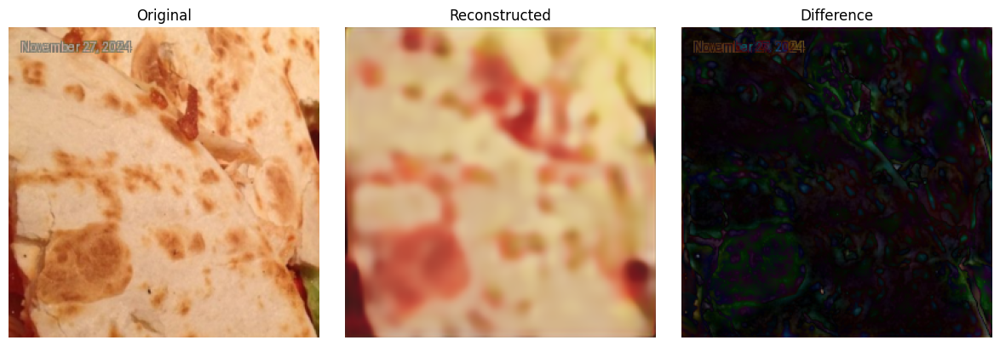

cpu


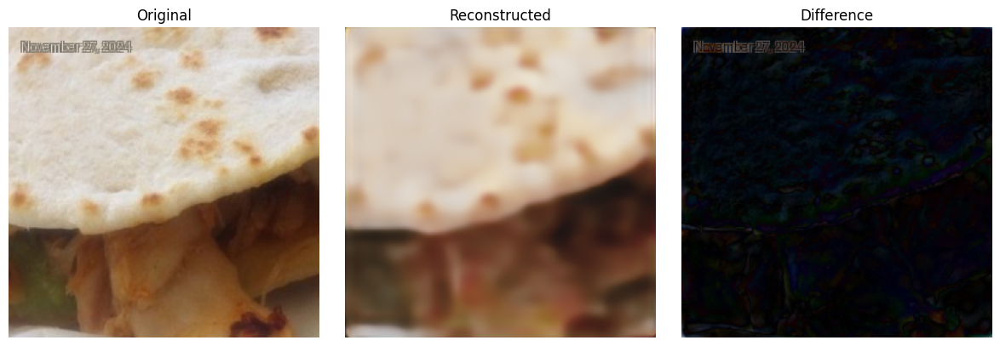

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.007892489..0.9907577].


cpu


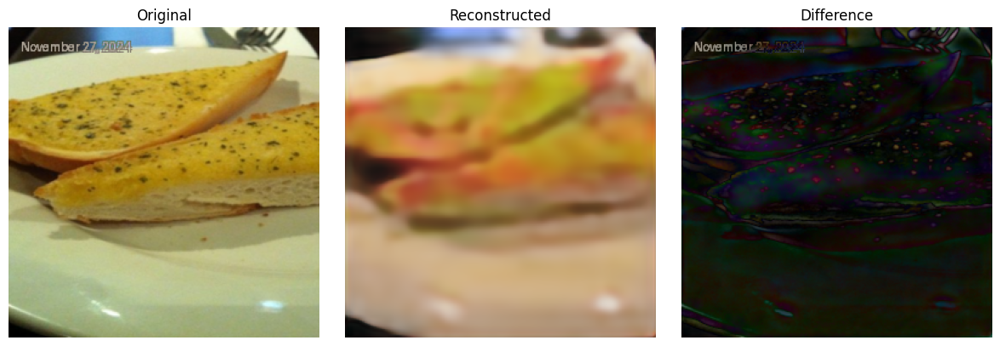

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.008471459..0.87205285].


cpu


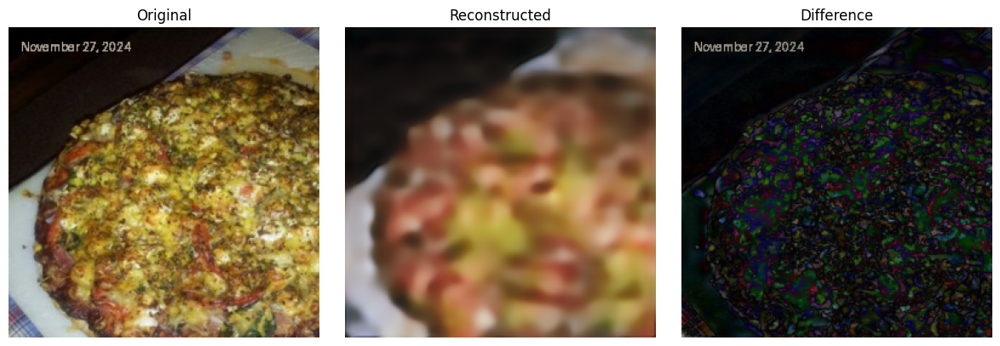

cpu


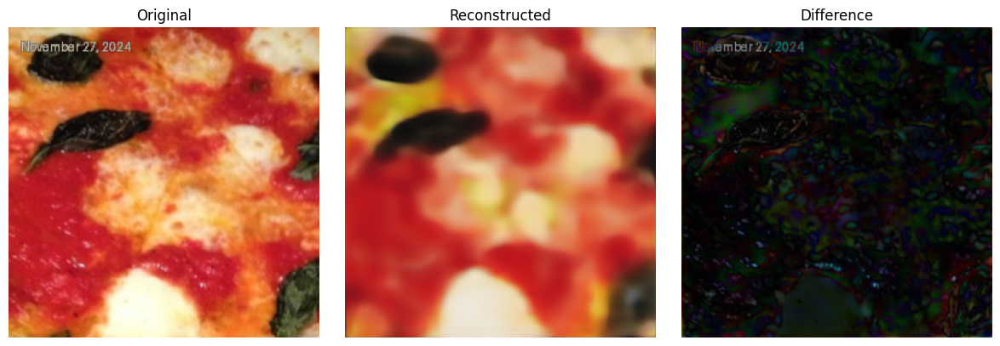

cpu


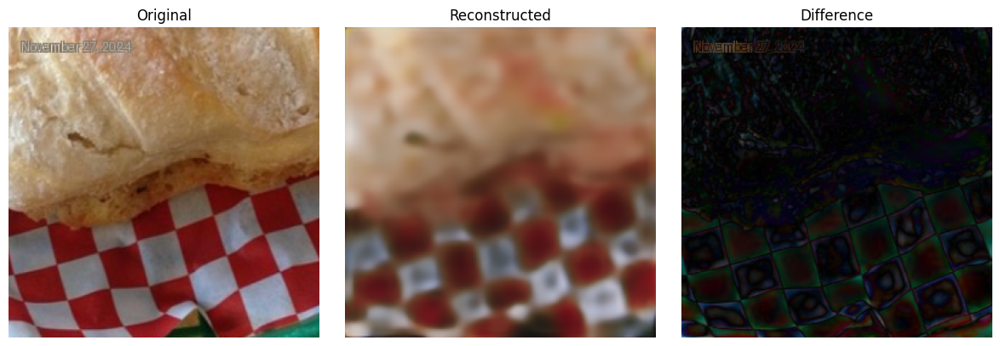

cpu


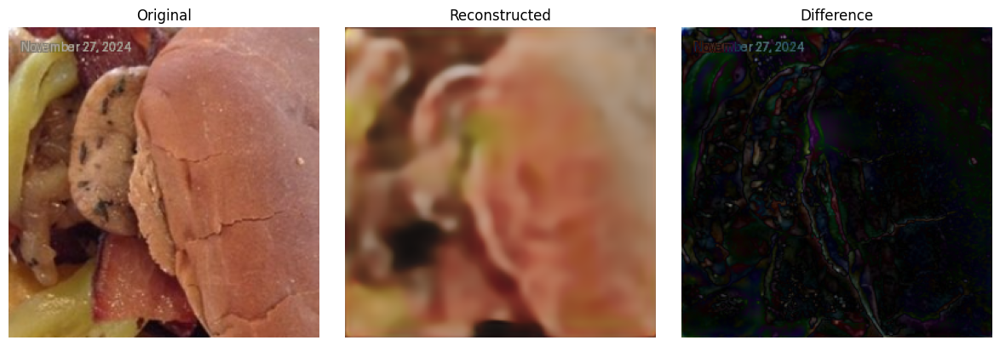

cpu


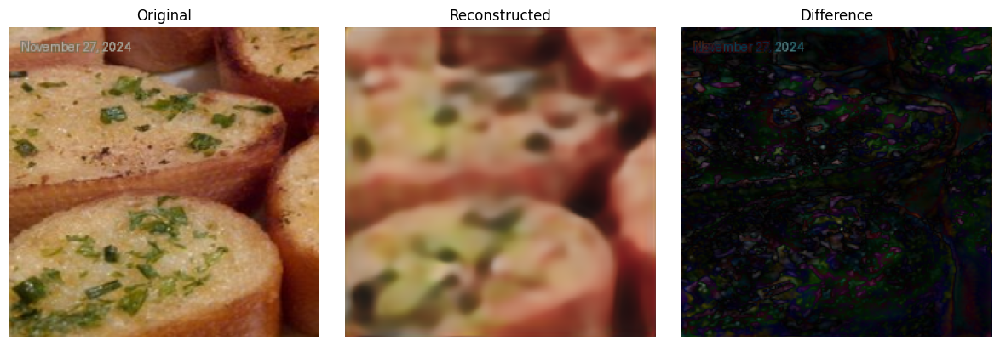

cpu


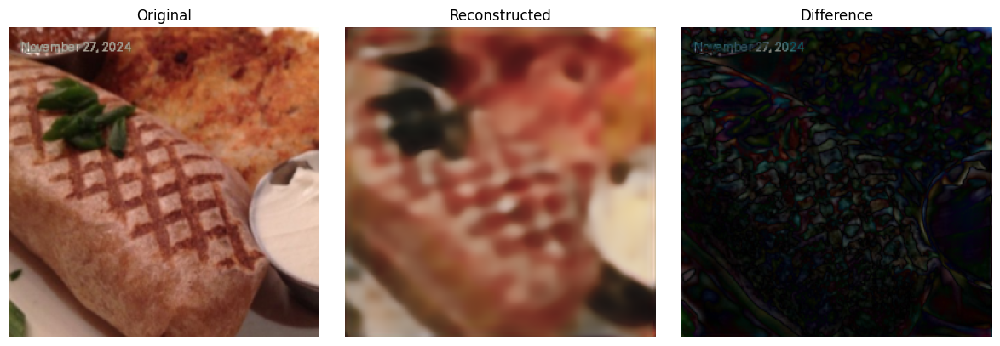

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.024113..1.0123422].


cpu


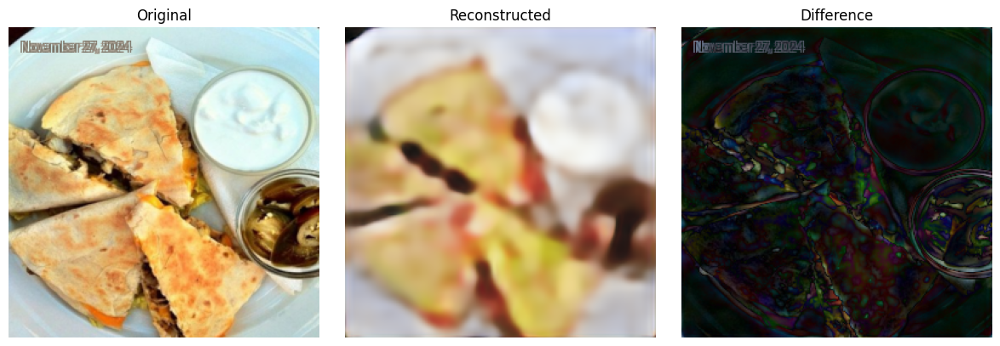

cpu


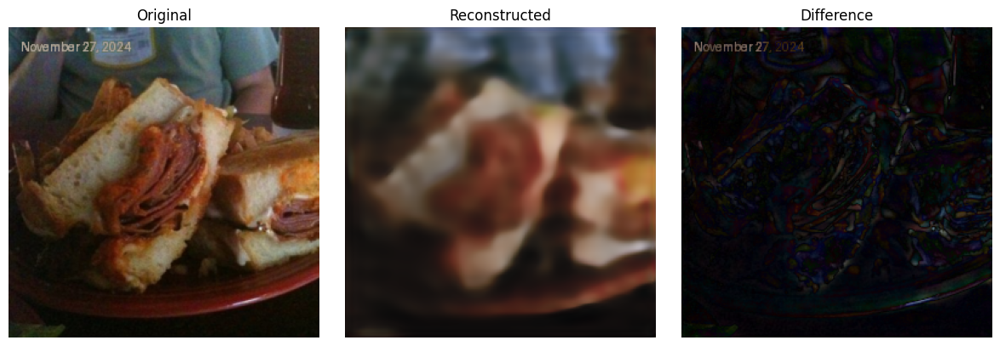

cpu


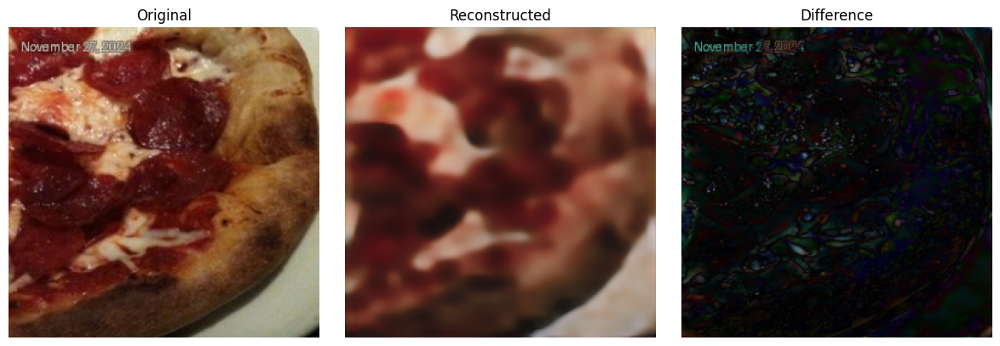

cpu


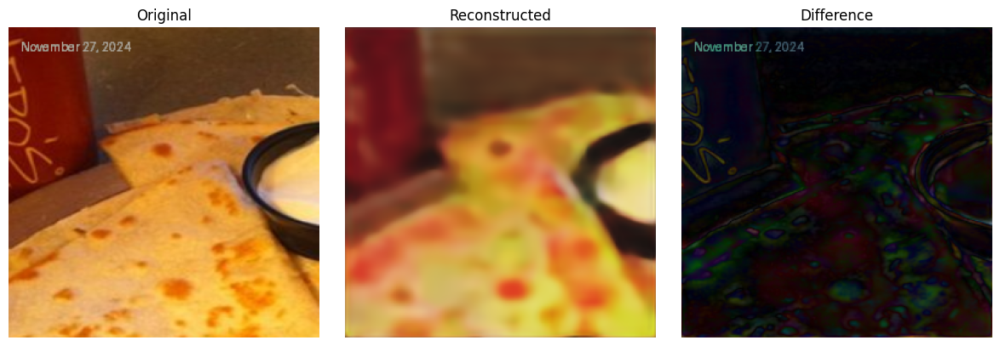

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.014994204..1.0789694].


cpu


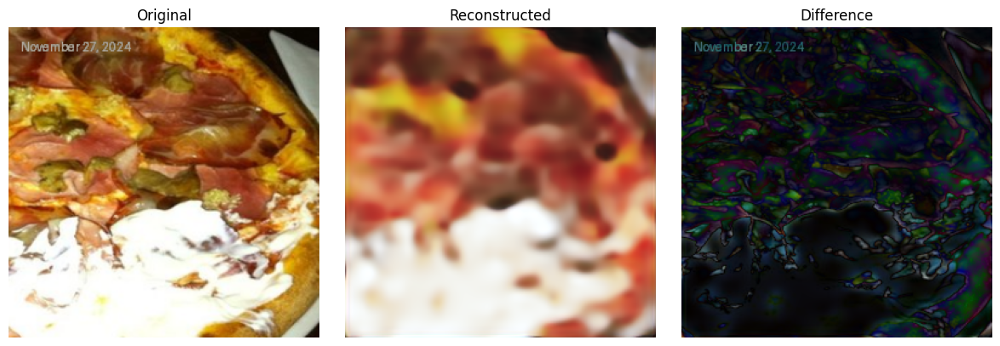

cpu


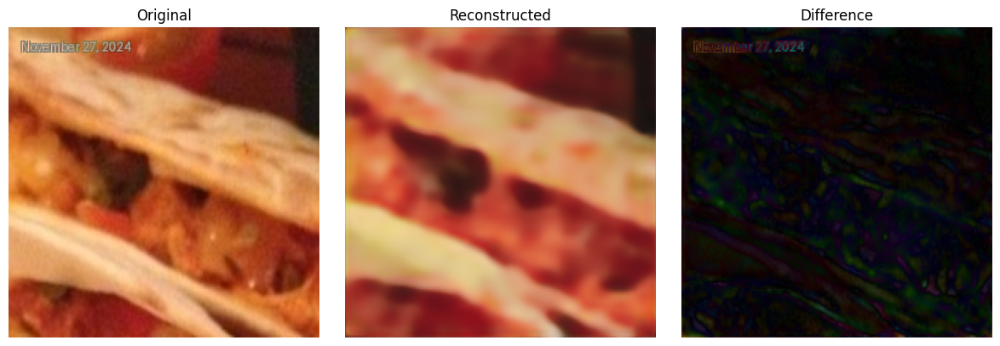

cpu


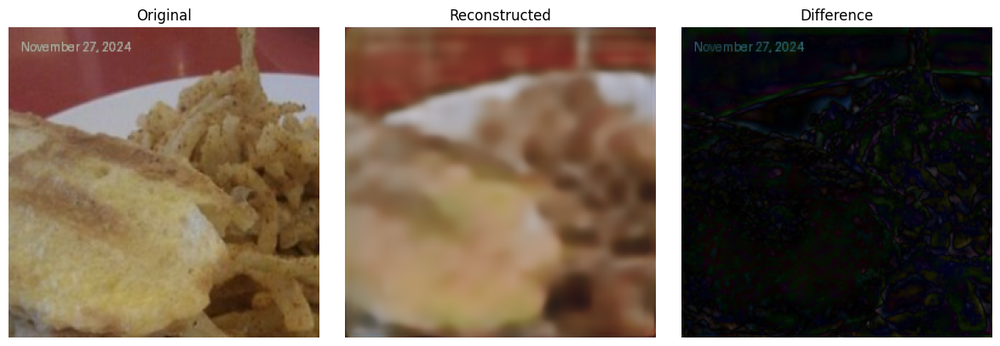

cpu


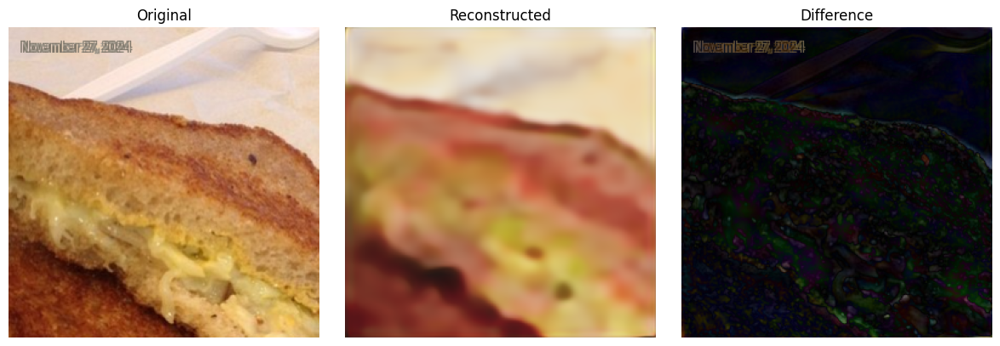

cpu


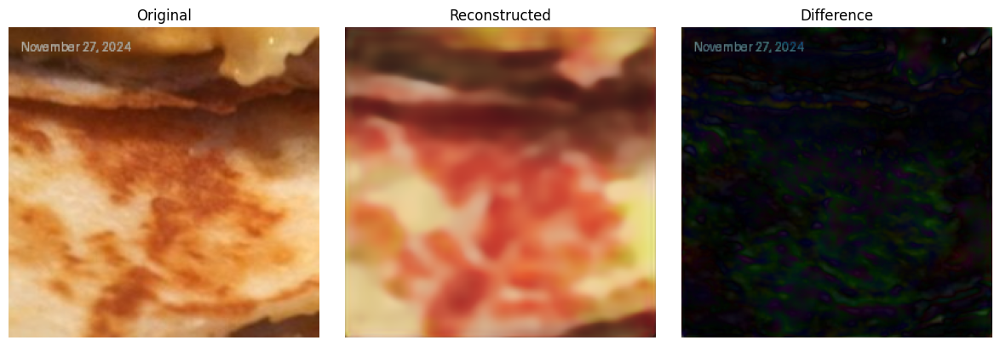

cpu


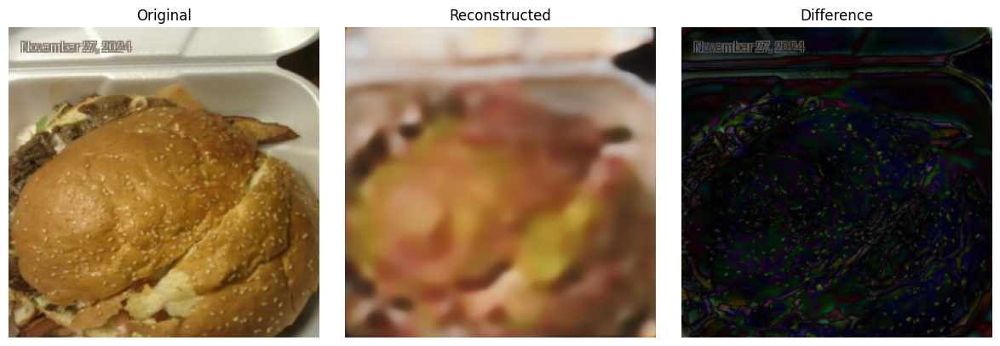

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.06771192..1.0625163].


cpu


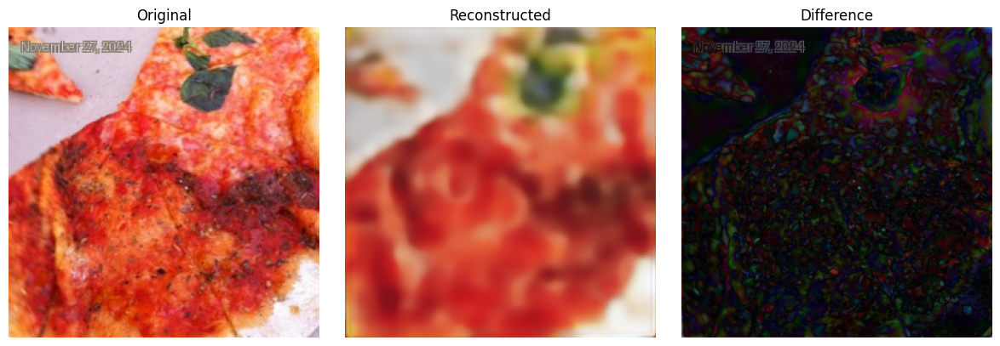

In [17]:
# Set the model to evaluation mode
model.eval()

# Get a batch of data from the test loader
data_iter = iter(test_loader)
stamped_images, base_images, _ = next(data_iter)
stamped_images = stamped_images.to(device)
base_images = base_images.to(device)

# Perform inference with the diffusion model
with torch.no_grad():
      # Start with the original stamped images
    num_steps = 1  # Number of iterative denoising steps
    
   
        # Pass through the model to progressively denoise
    noise_level = 0.2
    noisy_images = add_noise(stamped_images, noise_level)
    

    outputs = model(noisy_images)


# Display the first 20 results
for i in range(min(20, len(stamped_images))):
    display_images(stamped_images[i], outputs[i])


## 5.1 Model Selection
<!--
- Choose the model(s) to be trained (e.g., linear regression, decision trees, neural networks).
-->

## 5.2 Model Training
<!--
- Train the selected model(s) using the training data.
-->

## 5.3 Model Evaluation
<!--
- Evaluate model performance on validation data.
- Use appropriate metrics (e.g., accuracy, precision, recall, RMSE).
-->

## 5.4 Hyperparameter Tuning
<!--
- Fine-tune the model using techniques like Grid Search or Random Search.
- Evaluate the impact of different hyperparameters.
-->

## 5.5 Model Testing
<!--
- Evaluate the final model on the test dataset.
- Ensure that the model generalizes well to unseen data.
-->

## 5.6 Model Interpretation (Optional)
<!--
- Interpret the model results (e.g., feature importance, SHAP values).
- Discuss the strengths and limitations of the model.
-->

---

# 6. Predictions


## 6.1 Make Predictions
<!--
- Use the trained model to make predictions on new/unseen data.
-->

## 6.2 Save Model and Results
<!--
- Save the trained model to disk for future use.
- Export prediction results for further analysis.
-->

---

# 7. Documentation and Reporting

## 7.1 Summary of Findings
<!--
- Summarize the results and findings of the analysis.
-->

## 7.2 Next Steps
<!--
- Suggest further improvements, alternative models, or future work.
-->

## 7.3 References
<!--
- Cite any resources, papers, or documentation used.
-->